In [1]:
import torch
import torchaudio
import torchaudio.transforms as T
import torchaudio.functional as F
import os, re, random
import numpy as np
import pickle
from tqdm.auto import tqdm
from IPython.display import clear_output
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

print(torch.__version__)
print(torchaudio.__version__)

2.0.0+cu117
2.0.1+cu117


# Getting all wav files

In [7]:
path = '/home/ivan/audio-collector-async-tg-bot'

sound_list = list()

        
for root, dirs, files in os.walk(path, topdown=False):
    for file in files:
        if re.search(".wav", file) and re.search("user", root):
            file_path = os.path.join(root, file)
            sound_list.append(file_path)

random.shuffle(sound_list)
len(sound_list)

2851

## For deleting prev results

In [5]:
for sound in sound_list:
    if re.search("new", sound):
        os.remove(sound)

In [24]:
import math

import IPython.display as ipd
import matplotlib.pyplot as plt

from torchaudio.utils import download_asset

# Experiments

In [6]:
SAMPLE_WAV = random.choice(sound_list)
torchaudio.sox_effects.effect_names() 

['allpass',
 'band',
 'bandpass',
 'bandreject',
 'bass',
 'bend',
 'biquad',
 'chorus',
 'channels',
 'compand',
 'contrast',
 'dcshift',
 'deemph',
 'delay',
 'dither',
 'divide',
 'downsample',
 'earwax',
 'echo',
 'echos',
 'equalizer',
 'fade',
 'fir',
 'firfit',
 'flanger',
 'gain',
 'highpass',
 'hilbert',
 'loudness',
 'lowpass',
 'mcompand',
 'norm',
 'oops',
 'overdrive',
 'pad',
 'phaser',
 'pitch',
 'rate',
 'remix',
 'repeat',
 'reverb',
 'reverse',
 'riaa',
 'silence',
 'sinc',
 'speed',
 'stat',
 'stats',
 'stretch',
 'swap',
 'synth',
 'tempo',
 'treble',
 'tremolo',
 'trim',
 'upsample',
 'vad',
 'vol']

In [7]:
def plot_waveform(waveform, sample_rate, title="Waveform", xlim=None):
    waveform = waveform.numpy()

    num_channels, num_frames = waveform.shape
    time_axis = torch.arange(0, num_frames) / sample_rate

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    ax1.plot(time_axis, waveform[0], linewidth=1)
    ax2.specgram(waveform[0], Fs=sample_rate)
    
    ax1.grid(True)
    if xlim:
        ax1.set_xlim(xlim)
        
    fig.suptitle(title)
    plt.show()

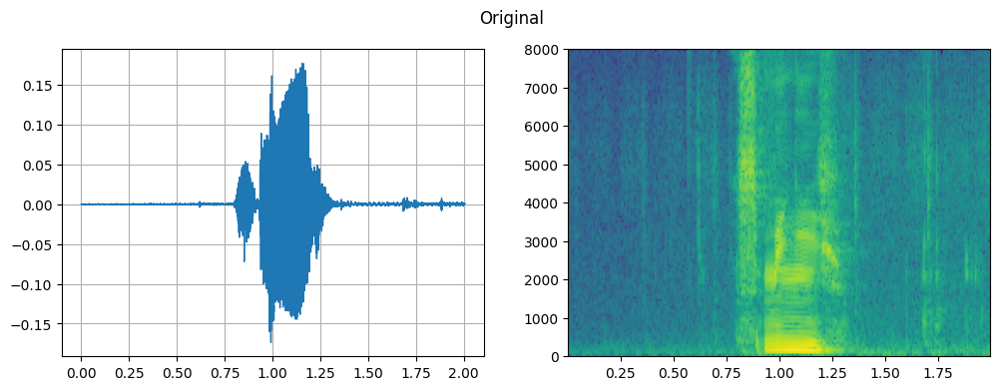

I can't use allpass
I can't use band
I can't use bandpass
I can't use bandreject
I can't use bass


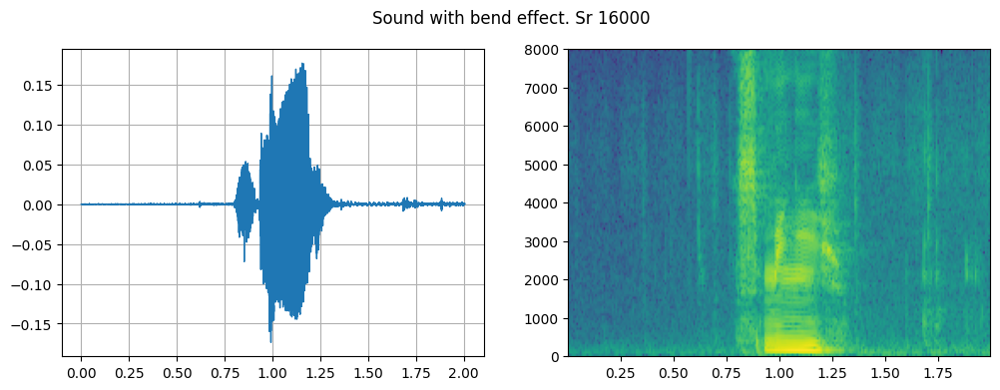

/home/ivan/course_work/venv/lib/python3.8/site-packages/matplotlib/axes/_axes.py:7773: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


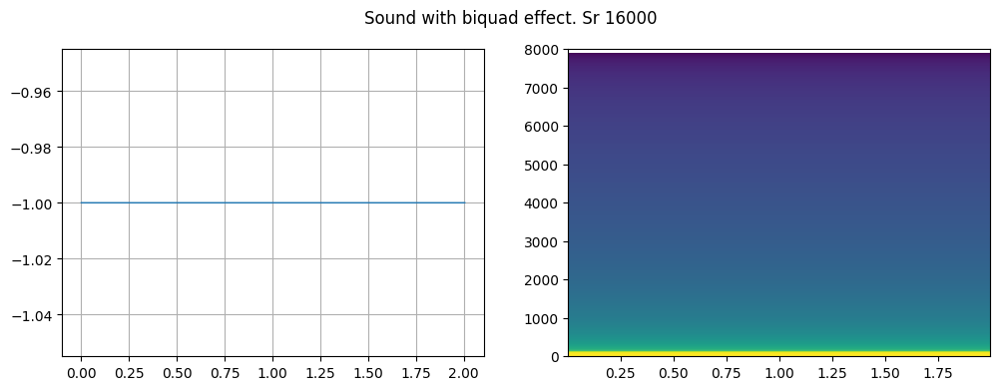

I can't use chorus


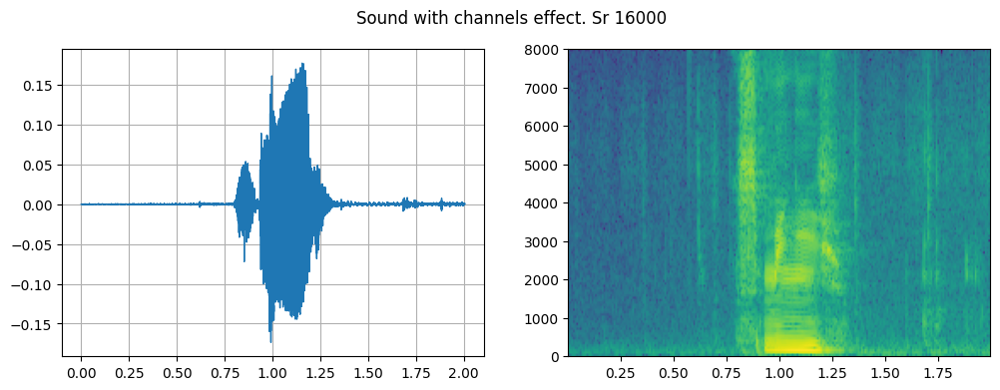

I can't use compand


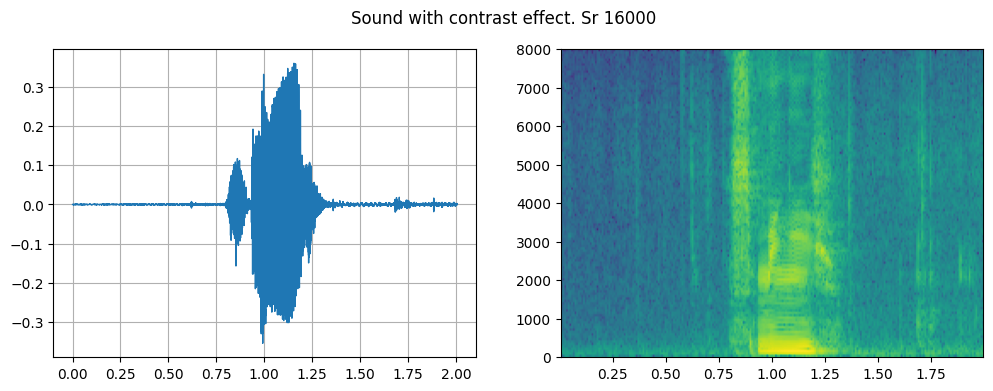

I can't use dcshift
I can't use deemph


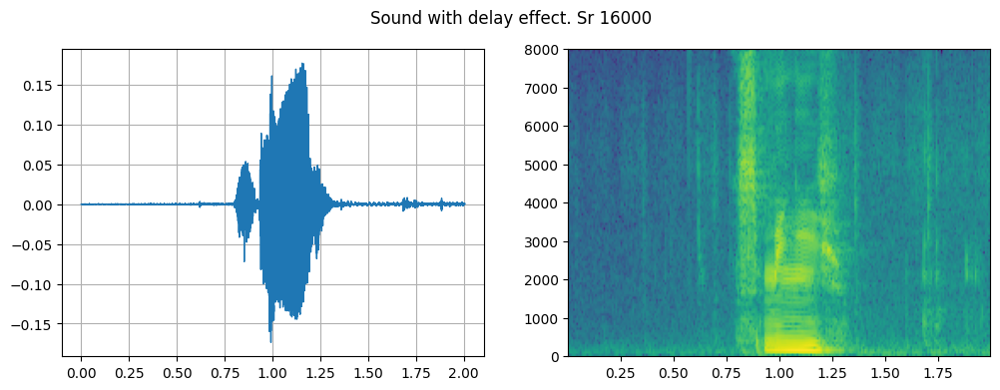

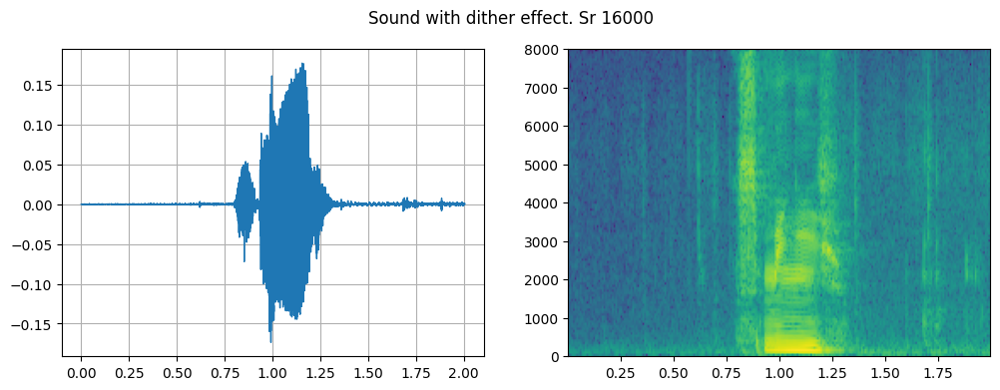

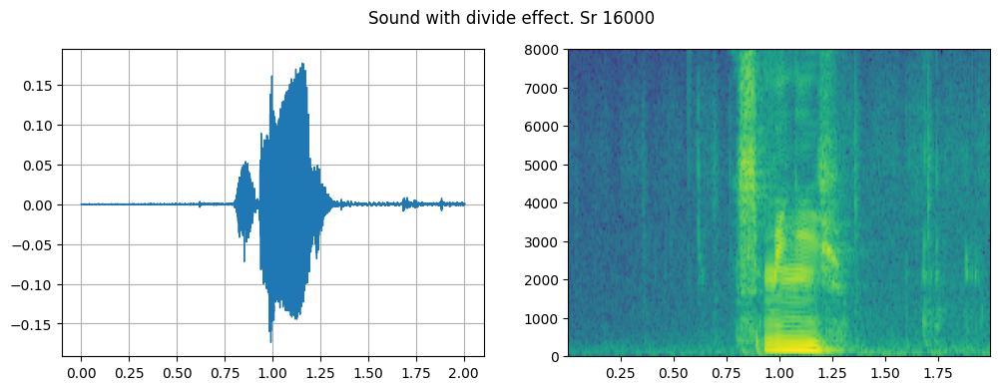

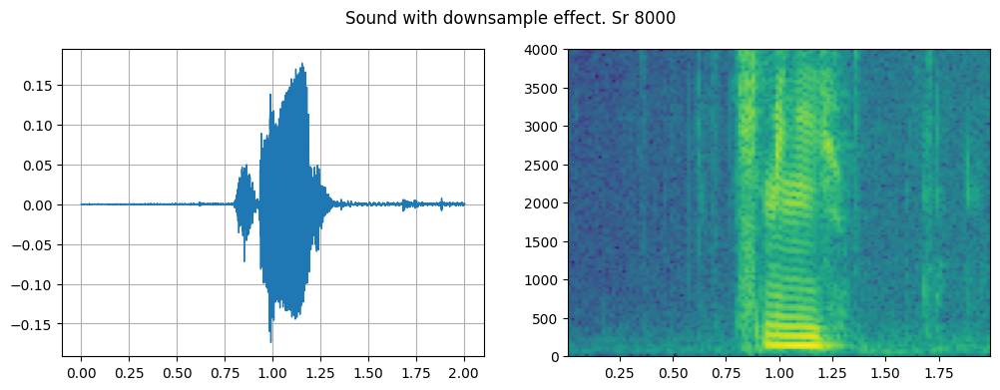

I can't use earwax
I can't use echo
I can't use echos
I can't use equalizer
I can't use fade


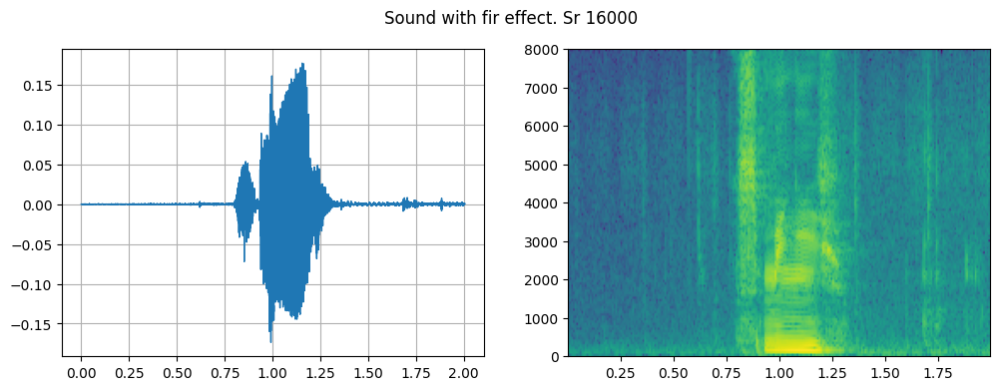

I can't use firfit


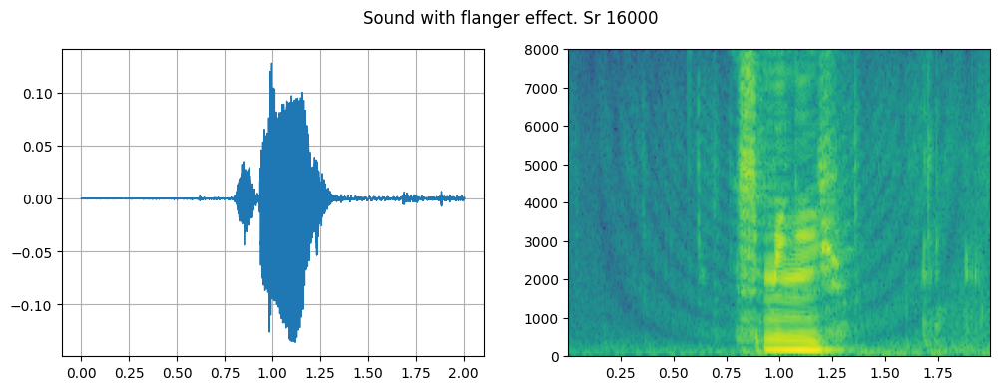

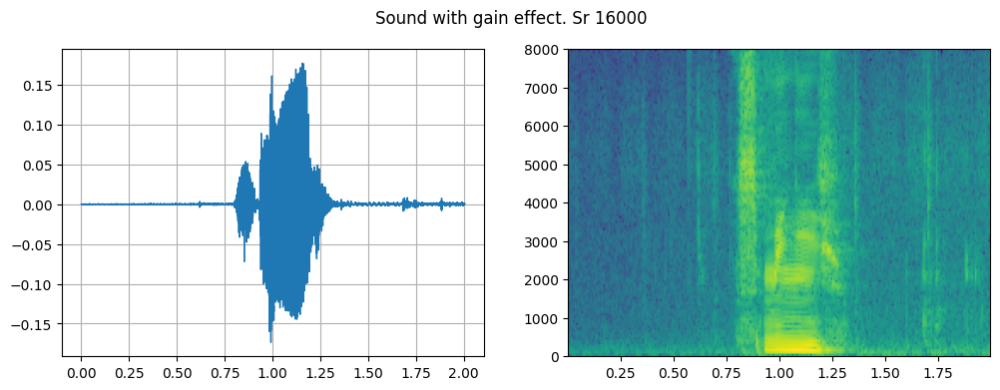

I can't use highpass


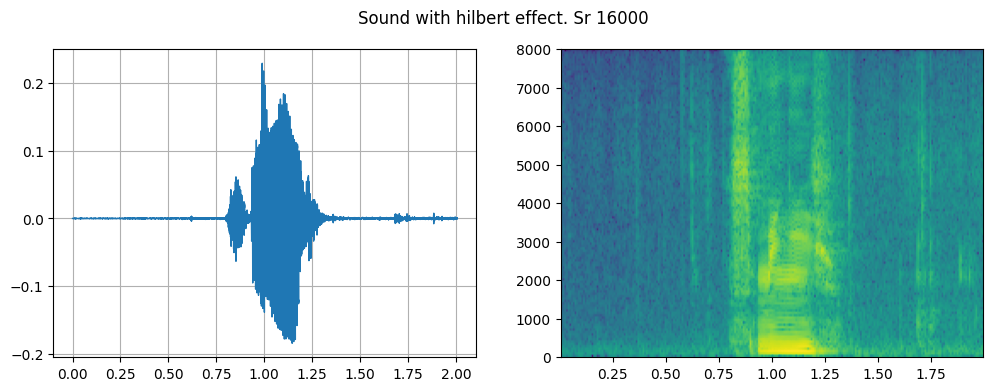

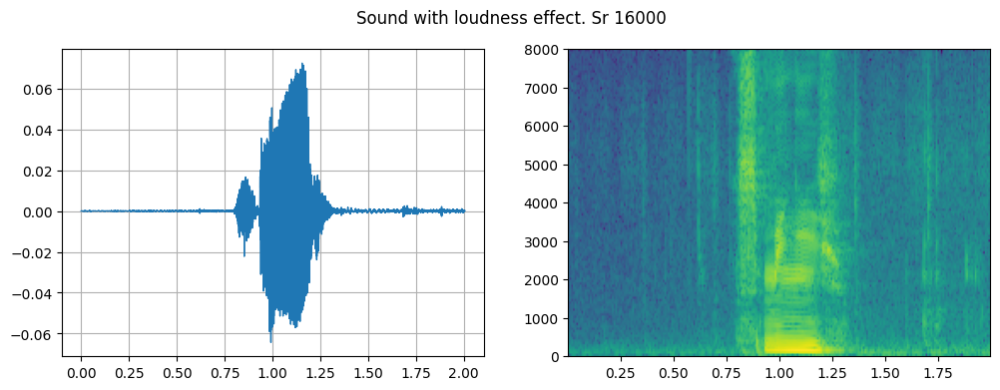

I can't use lowpass
I can't use mcompand


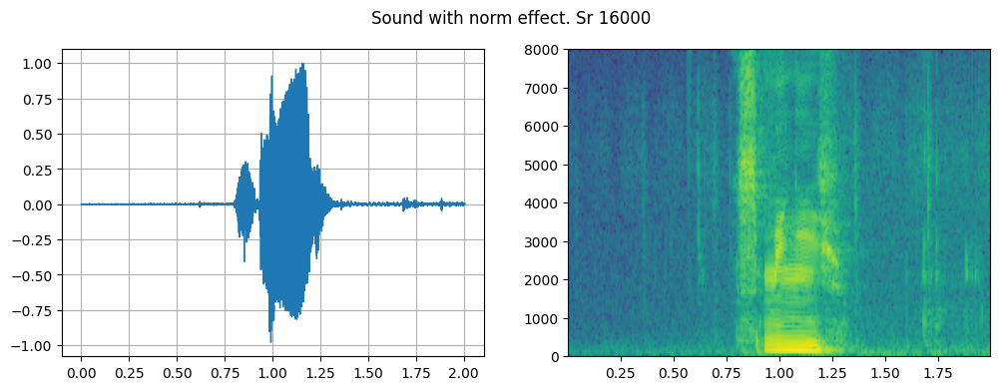

I can't use oops


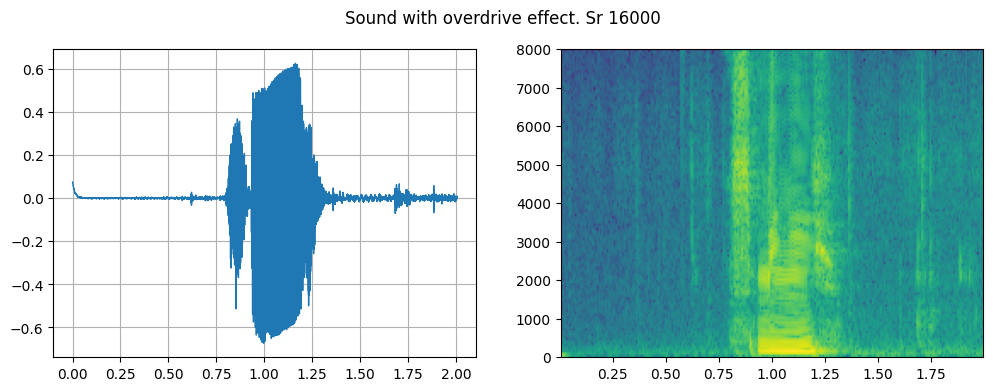

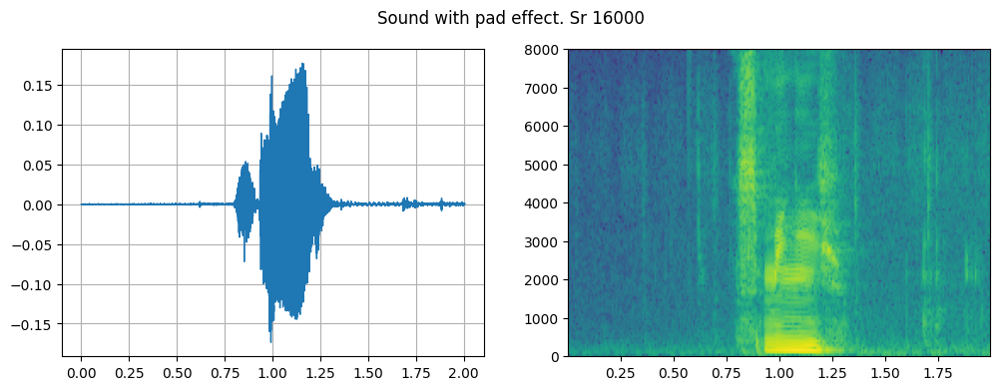

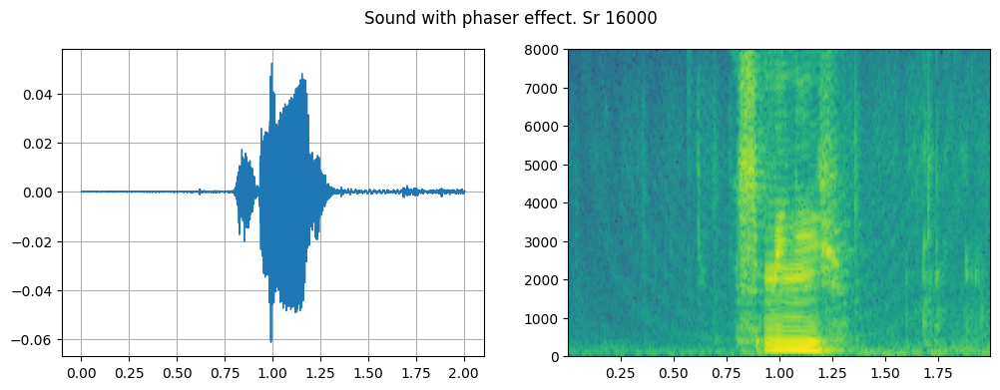

I can't use pitch


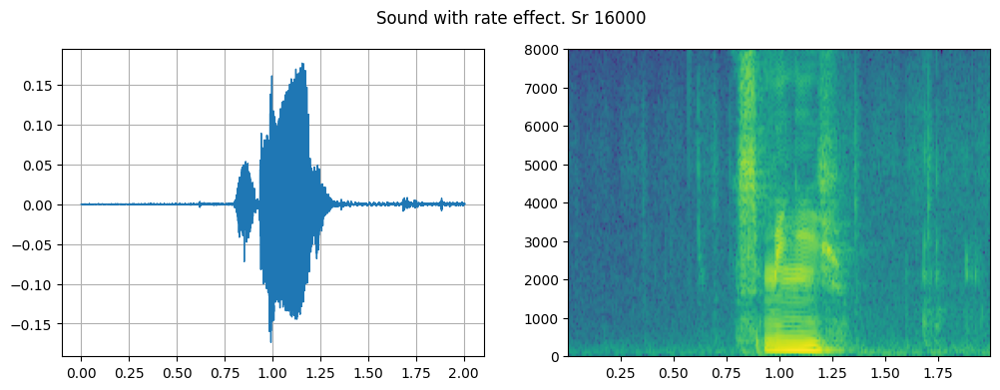

I can't use remix


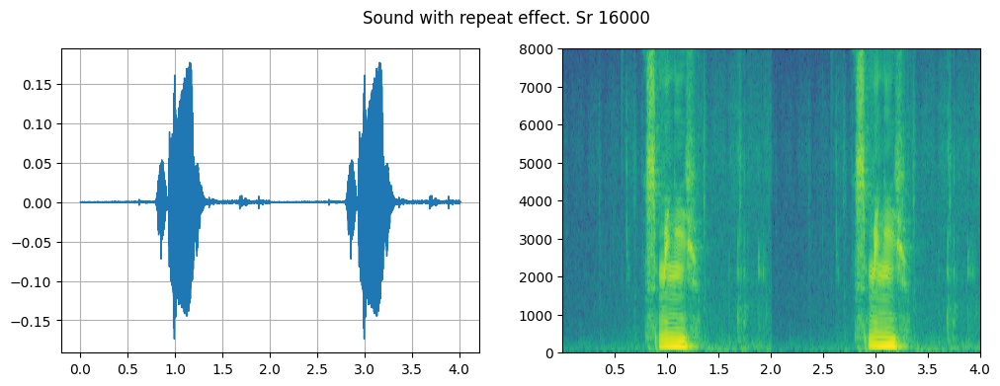

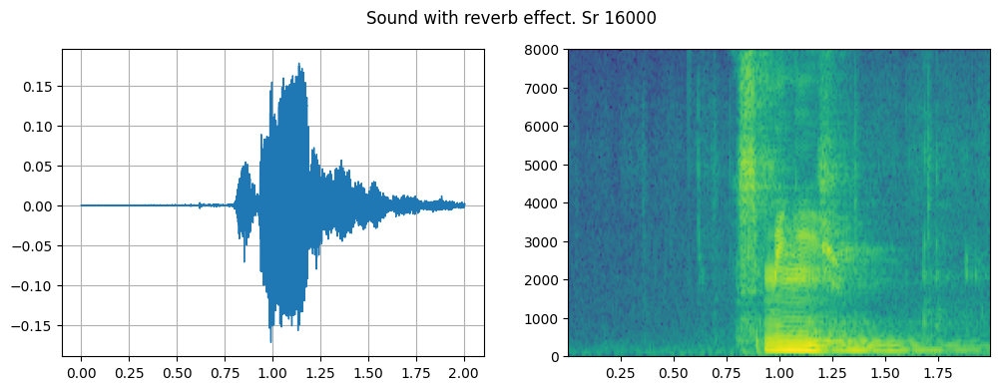

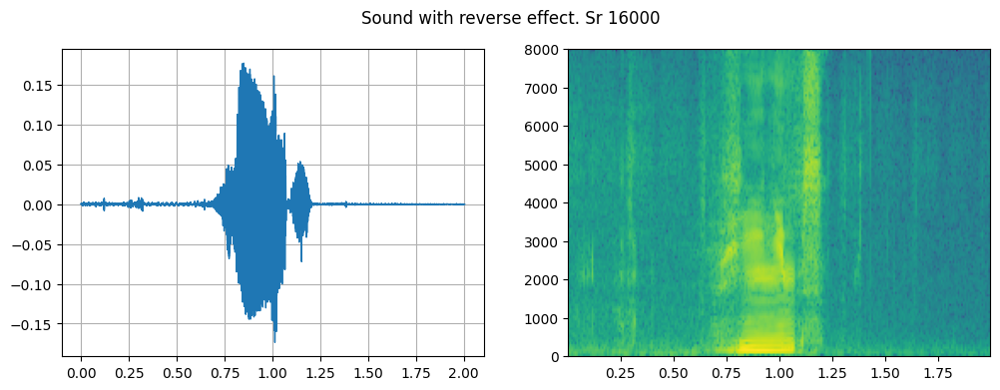

I can't use riaa
I can't use silence
I can't use sinc
I can't use speed


Samples read:             32080
Length (seconds):      2.005000
Scaled by:         2147483647.0
Maximum amplitude:     0.177124
Minimum amplitude:    -0.173584
Midline amplitude:     0.001770
Mean    norm:          0.010123
Mean    amplitude:    -0.000001
RMS     amplitude:     0.028232
Maximum delta:         0.165100
Minimum delta:         0.000000
Mean    delta:         0.002960
RMS     delta:         0.008665
Rough   frequency:          781
Volume adjustment:        5.646


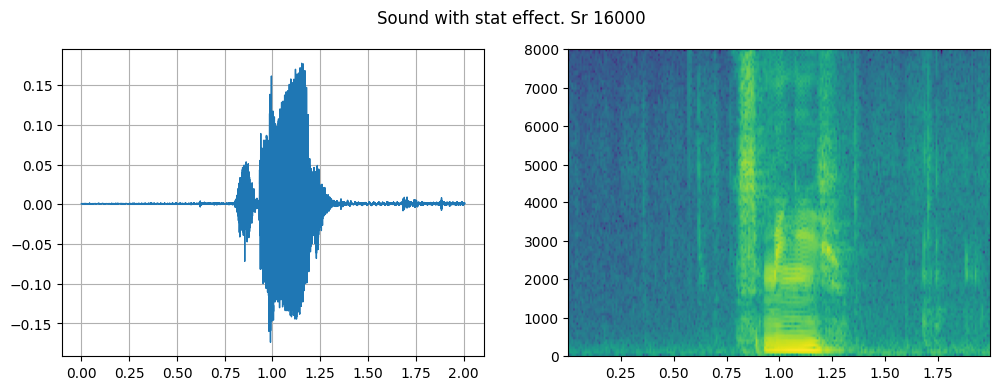

DC offset  -0.000001
Min level  -0.173584
Max level   0.177124
Pk lev dB     -15.03
RMS lev dB    -30.99
RMS Pk dB     -20.92
RMS Tr dB     -76.89
Crest factor    6.27
Flat factor     0.00
Pk count           2
Bit-depth      14/16
Num samples    32.1k
Length s       2.005
Scale max   1.000000
Window s       0.050


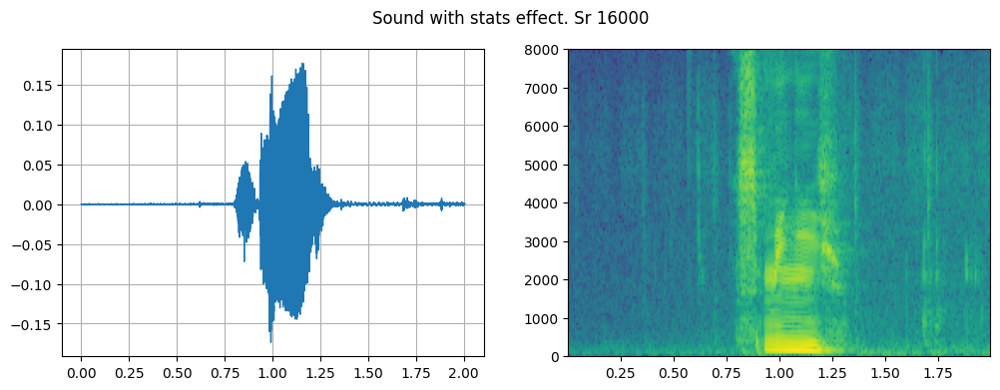

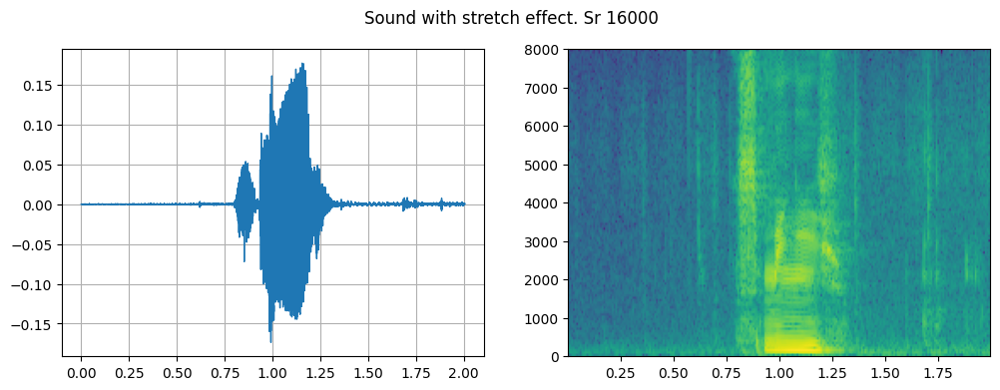

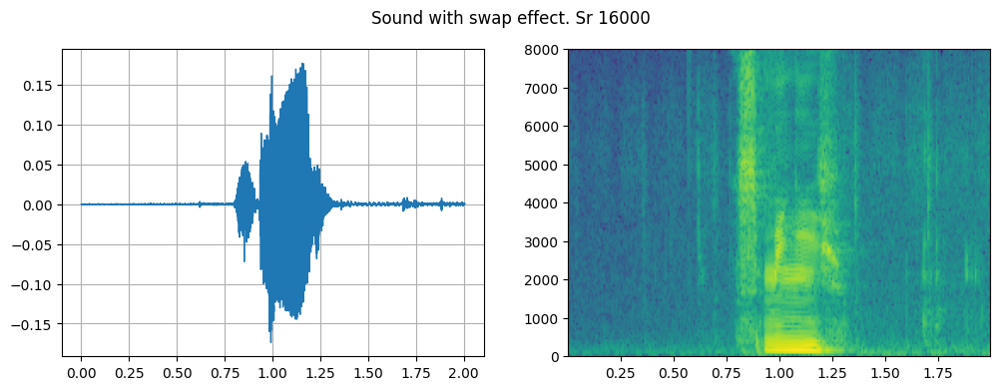

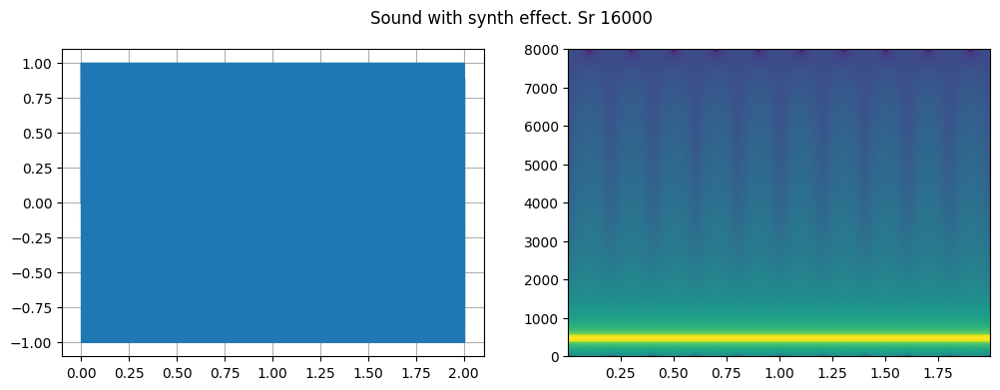

I can't use treble
I can't use tremolo


/tmp/ipykernel_1301142/2866421512.py:9: UserWarning: Only one segment is calculated since parameter NFFT (=256) >= signal length (=0).
  ax2.specgram(waveform[0], Fs=sample_rate)


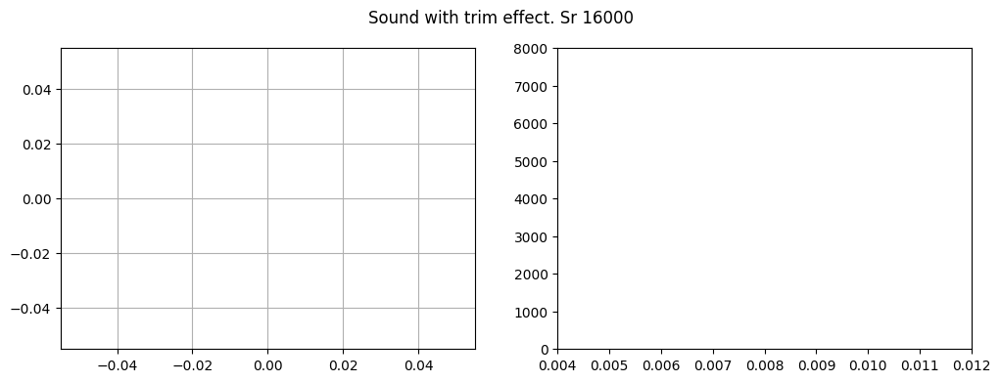

I can't use trim


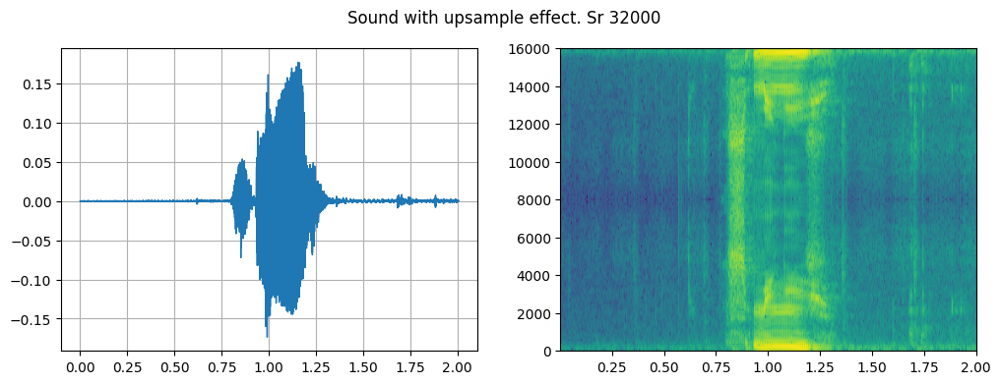

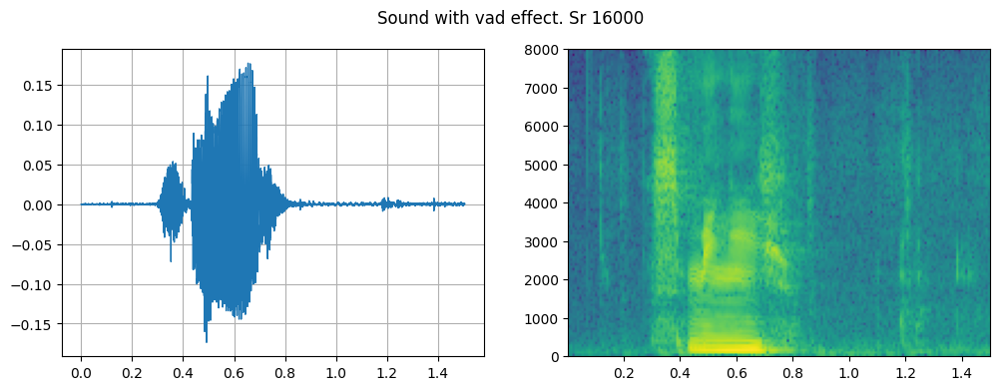

I can't use vol


In [8]:
pos_effects = torchaudio.sox_effects.effect_names()
waveform1, sample_rate1 = torchaudio.load(SAMPLE_WAV)
plot_waveform(waveform1, sample_rate1, title="Original")
ipd.Audio(waveform1, rate=sample_rate1)
for effect in pos_effects:
    if effect == 'tempo':
        continue
    effects = [
        [effect]
    ]
    try:
        waveform2, sample_rate2 = torchaudio.sox_effects.apply_effects_file(SAMPLE_WAV, effects, channels_first=True)
        plot_waveform(waveform2, sample_rate2, title=f"Sound with {effect} effect. Sr {sample_rate2}")
        ipd.Audio(waveform2, rate=sample_rate2)
    except (RuntimeError, ValueError):
        print(f"I can't use {effect}")


torch.Size([1, 32080]) 16000
torch.Size([1, 24080]) 16000


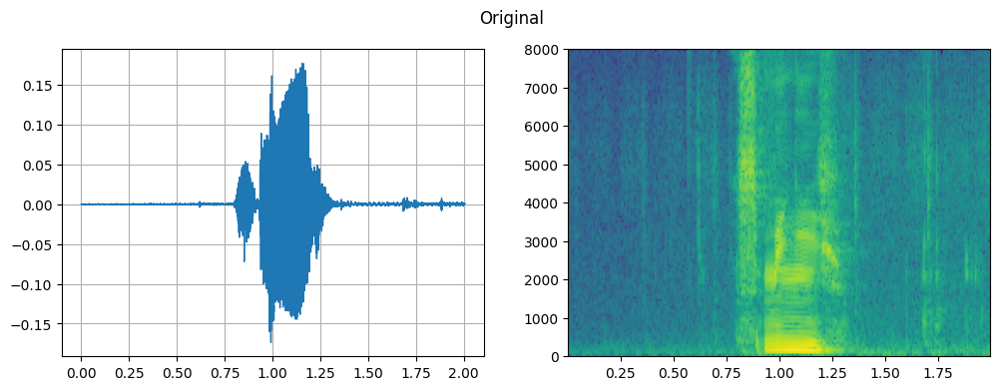

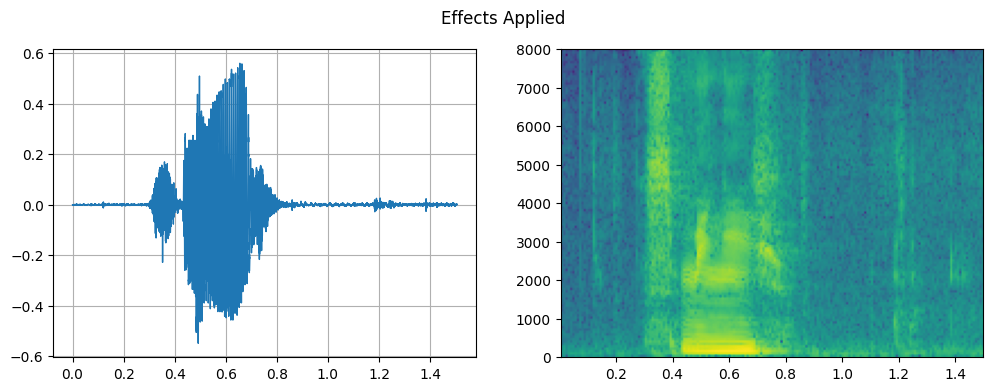

In [9]:
# Load the data
waveform1, sample_rate1 = torchaudio.load(SAMPLE_WAV)

effects_new = [
        ["channels", '1'],
        ["rate", '16000'],
        ['pitch', '-200']
]

effects_2 = [
    ["channels", '1'],
    ["rate", '16000'],
    ['reverb', '-w']
]

effects_3 = [
    ["channels", '1'],
    ["lowpass", "-1", "300"], #3kГц
    ['speed', '1.1']
]

effects_7 = [ # add noise
    ["channels", '1'],
    ['fir', '0.25', '0.25', '0.25'],
    ['delay', '0.8']
]

effects_10 = [
    ["channels", '1'],
    ['hilbert'],
    ['overdrive']
]

effect_13 = [
    ["channels", '1'],
    ['vad'],
    ['gain', '10']
]

effect_14 = [
    ['channels', '1'],
    ['chorus', '0.7', '0.9', '55', '0.4', '0.25', '2', '-s']
]

effect_15 = [
    ['channels', '1'],
    ['chorus', '0.7', '0.9', '55', '0.4', '0.25', '2', '-t']
]

effect_16 = [
    ['channels', '1'],
    ['silence', '1.1', '1', '5'],
    ['reverse']
]
effect_17 = [
    ['channels', '1'],
    ['reverse']
]

effects_6 = [
    ["channels", '1'],
    ['flanger', '15', '5', '80'],
    ['contrast', '50']
]

effects_8 = [
    ["channels", '1'],
    ['flanger', '12', '10', '80'],
    ['fir', '1', '1', '1']
]

effects_9 = [
    ["channels", '1'],
    ['flanger', '12', '10', '80'],
    ['loudness', '5']
]

effect_11 = [
    ["channels", '1'],
    ['vad'],
    ['phaser', '0.8', '0.6', '5', '0.24', '2', '-s']
]

effect_12 = [
    ["channels", '1'],
    ['stretch', '0.8']
]

effect_14 = [
    ['channels', '1'],
    ['chorus', '0.7', '0.9', '55', '0.4', '0.25', '2', '-s']
]

effect_15 = [
    ['channels', '1'],
    ['chorus', '0.7', '0.9', '55', '0.4', '0.25', '2', '-t']
]

# Apply effects
waveform2, sample_rate2 = torchaudio.sox_effects.apply_effects_file(SAMPLE_WAV, effect_13, channels_first=True)

print(waveform1.shape, sample_rate1)
print(waveform2.shape, sample_rate2)

plot_waveform(waveform1, sample_rate1, title="Original")
ipd.Audio(waveform1, rate=sample_rate1)

plot_waveform(waveform2, sample_rate2, title="Effects Applied")
ipd.Audio(waveform2, rate=sample_rate2)

# Adding noise

In [7]:
def create_noise(SNR_db, p, noise_size):
    snr = 10.0 ** (SNR_db / 10.0)
    sample_noise = np.random.normal(0, np.sqrt(p / snr), noise_size)
    return sample_noise

def noisy_audio(speech, snr=3):
    noise = create_noise(snr, torch.var(speech[0]), len(speech[0]))
    noisy_speech = speech + noise
    return noisy_speech.to(torch.float32)

In [11]:
speech, _ = torchaudio.load(SAMPLE_WAV)
noisy_speech = noisy_audio(speech, snr=10)
noisy_speech, speech

(tensor([[-0.0039, -0.0012, -0.0087,  ...,  0.0013, -0.0008,  0.0041]]),
 tensor([[0.0000, 0.0000, 0.0000,  ..., 0.0012, 0.0009, 0.0005]]))

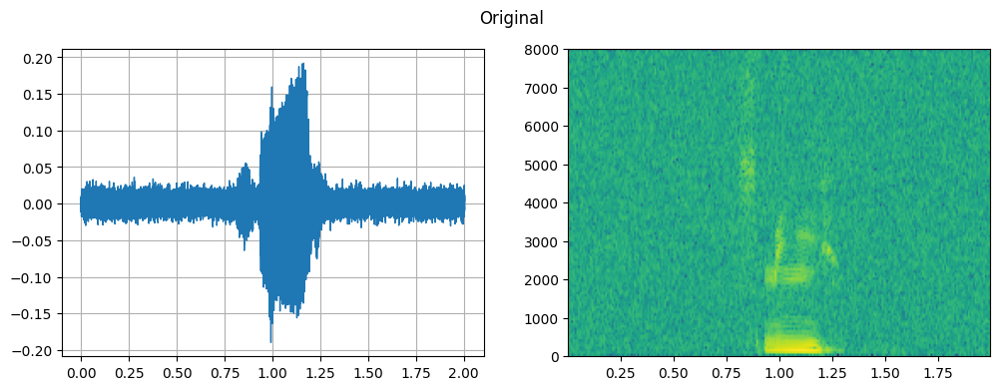

In [12]:
plot_waveform(noisy_speech, sample_rate1, title="Original")
ipd.Audio(noisy_speech, rate=sample_rate1)

# Creating new dataset

In [25]:
effects = {
    'Reverb': [[["channels", '1'], ['reverb', '-w'], ["rate", '16000'], ['speed', str(rate)]] for rate in [0.9, 1, 1.1]],
    'Lowpass': [[["channels", '1'], ["lowpass", "-1", "300"], ["rate", '16000'], ['speed', str(rate)]] for rate in [0.9, 1, 1.1]],
    'Speed_pitch': [[["channels", '1'], ["rate", '16000'], ['pitch', f'{level}']] for level in [-250, -200, -150, 150, 200, 250]],
    'Contrast': [[["channels", '1'], ["rate", '16000'], ['flanger', '10', '10', '80'], ['contrast', str(val)], ['pitch', f'{level}']] for val in [10, 25, 75] for level in [-250, -200, -150, 0, 150, 200, 250]],
    'Fir': [[["channels", '1'], ["rate", '16000'], ['flanger', '12', '10', '80'], ['fir', str(val), str(val), str(val)]] for val in [0.5, 1, 2]],
    'Hilbert': [[["channels", '1'], ["rate", '16000'], ['hilbert'], ['overdrive'], ['pitch', f'{level}']] for level in [-250, -200, -150, 0, 150, 200, 250]],
    'Phaser': [[["channels", '1'], ["rate", '16000'], ['vad'], ['phaser', '0.8', '0.6', '5', '0.24', '2', '-s'], ['pitch', f'{level}']] for level in [-250, -200, -150, 0, 150, 200, 250]],
    'Stretch': [[["channels", '1'], ['stretch', str(val)], ['pitch', f'{level}']] for val in [0.6, 0.8] for level in [-250, -200, -150, 0, 150, 200, 250]],
    'Chorus': [[['channels', '1'], ['chorus', '0.7', '0.9', '55', '0.4', '0.25', '2', val], ['pitch', f'{level}']] for val in ['-t', '-s'] for level in [-250, -200, -150, 0, 150, 200, 250]],
    'Noise_Stretch': [[["channels", '1'], ['stretch', str(val)], ['pitch', f'{level}']] for val in [0.6, 0.8] for level in [-250, -200, -150, 0, 150, 200, 250]],
    'Noise_Chorus': [[['channels', '1'], ['chorus', '0.7', '0.9', '55', '0.4', '0.25', '2', val], ['pitch', f'{level}']] for val in ['-t', '-s'] for level in [-250, -200, -150, 0, 150, 200, 250]],
    'Noise_speed_pitch': [[["channels", '1'], ["rate", '16000'], ['pitch', f'{level}']] for level in [-250, -200, -150, 0, 150, 200, 250]],
    'Noise_Loudness': [[["channels", '1'], ["rate", '16000'], ['flanger', '12', '10', '80'], ['loudness', str(val)], ['pitch', f'{level}']] for val in [1, 10] for level in [-250, -200, -150, 0, 150, 200, 250]],
    'Noise_delay': [[["channels", '1'], ["rate", '16000'], ['fir', '0.25', '0.25', '0.25'], ['delay', str(val)]] for val in [0.3, 0.5, 0.7, 0.9]],
    'Noise_non_effects': [[["channels", '1'], ["rate", '16000']]]
}

In [26]:
data = []

# RandAugment
while tqdm(sound_list):
    clear_output(wait=True)
    curr_audio_path = sound_list.pop()
    root = curr_audio_path.split('/')[-2]
    audio = curr_audio_path.split('/')[-1].split('.')[0]

    file_name = os.path.join(root, f'{audio}.wav')
    label = audio.split('_')[0]
    temp = {'name': file_name, 'label': label}
    data.append(temp)

    type_effect = random.choice(list(effects.keys()))
    if type_effect != 'Non_effects':
        for i, effect in enumerate(effects[type_effect]):
            print(effect)
            new_wave, sr = torchaudio.sox_effects.apply_effects_file(curr_audio_path, effect, channels_first=True)
            
            if type_effect.split('_')[0] == 'Noise':
                new_wave = noisy_audio(new_wave, snr=random.choice([1, 3]))
                
            file_name = os.path.join(root, f'{audio}_new_{i+1}.wav')
            temp = {'name': file_name, 'label': label}
            torchaudio.save(os.path.join(path, file_name), new_wave, sr)
            data.append(temp)

[['channels', '1'], ['rate', '16000'], ['pitch', '-250']]
[['channels', '1'], ['rate', '16000'], ['pitch', '-200']]
[['channels', '1'], ['rate', '16000'], ['pitch', '-150']]
[['channels', '1'], ['rate', '16000'], ['pitch', '150']]
[['channels', '1'], ['rate', '16000'], ['pitch', '200']]
[['channels', '1'], ['rate', '16000'], ['pitch', '250']]


0it [00:00, ?it/s]

In [27]:
len(data), data

(27778,
 [{'name': 'user_471339835/Вправо_8_1.wav', 'label': 'Вправо'},
  {'name': 'user_471339835/Вправо_8_1_new_1.wav', 'label': 'Вправо'},
  {'name': 'user_471339835/Вправо_8_1_new_2.wav', 'label': 'Вправо'},
  {'name': 'user_471339835/Вправо_8_1_new_3.wav', 'label': 'Вправо'},
  {'name': 'user_471339835/Вправо_8_1_new_4.wav', 'label': 'Вправо'},
  {'name': 'user_471339835/Вправо_8_1_new_5.wav', 'label': 'Вправо'},
  {'name': 'user_471339835/Вправо_8_1_new_6.wav', 'label': 'Вправо'},
  {'name': 'user_471339835/Вправо_8_1_new_7.wav', 'label': 'Вправо'},
  {'name': 'user_471339835/Вправо_8_1_new_8.wav', 'label': 'Вправо'},
  {'name': 'user_471339835/Вправо_8_1_new_9.wav', 'label': 'Вправо'},
  {'name': 'user_471339835/Вправо_8_1_new_10.wav', 'label': 'Вправо'},
  {'name': 'user_471339835/Вправо_8_1_new_11.wav', 'label': 'Вправо'},
  {'name': 'user_471339835/Вправо_8_1_new_12.wav', 'label': 'Вправо'},
  {'name': 'user_471339835/Вправо_8_1_new_13.wav', 'label': 'Вправо'},
  {'name': 'us

In [28]:
with open(f'../audio-collector-async-tg-bot/data_base_audio.pickle', 'wb') as f:
    pickle.dump(data, f)